# Load Libraries

In [2]:
import scanpy as sc
# import rapids_singlecell as rsc
import anndata
from glob import glob
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import yaml
import os
# import imc_analysis as imc
from pathlib import Path
sc.settings.set_figure_params(dpi=200, dpi_save=300, fontsize=22)
from tqdm import tqdm
import matplotlib
matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42
matplotlib.rcParams["axes.grid"] = False

In [3]:
cd ../

/Users/junbumkim/Documents/imc/data/ggo-imc


In [6]:
from scipy.stats import zscore
def run_umap(adata):
    adata = adata.copy()
    adata.obs_names_make_unique()
    
    sc.pp.scale(adata, max_value = 3)
    adata.X[adata.X < -3] = -3
    # sc.pp.scale(adata, max_value = 3)

    print(f'Performing PCA...')
    sc.pp.pca(adata)
    
    print(f'Performing Neighborhood Calculation...')
    sc.pp.neighbors(adata)
    
    print(f'Performing UMAP...')
    sc.tl.umap(adata, gamma = 3)
    # adata.obsm['X_umap'] = zscore(adata.obsm['X_umap'], axis = 0)

    # adata.obsm['X_umap'][adata.obsm['X_umap'] > 5] = 5
    # adata.obsm['X_umap'][adata.obsm['X_umap'] < -5] = -5
    # adata.obsm['X_umap'] = zscore(adata.obsm['X_umap'], axis = 0)
    return adata

# Read Data

In [5]:
from scripts.load_yaml import load
metadata = load('metadata/ggo_config.yml')

adata_dict = dict()
adata_dict2 = dict()

for p in ['PANEL_G', 'PANEL_H']:
    adata_dict[p] = sc.read(metadata[p]['AnnData']['phenotyped_file_name'])
    adata_dict[p] = adata_dict[p][:,~adata_dict[p].var.index.str.contains('EMPTY')]
    adata_dict[p].var['metal'] = adata_dict[p].var.index.str.split('(').str[1].str.replace(')','')
    adata_dict[p].var.index = adata_dict[p].var.index.str.split('(').str[0]
    adata_dict[p].var.index = adata_dict[p].var.index.str.replace('PanCytokeratin','PanCK').rename('Ab')
    adata_dict[p].var['panel'] = p
    adata_dict2[p] = adata_dict[p].copy()

/var/folders/m3/jlzygtz56hn0n13xjz1g33380000gn/T/ipykernel_26448/1440337197.py:10: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata_dict[p].var['metal'] = adata_dict[p].var.index.str.split('(').str[1].str.replace(')','')
/var/folders/m3/jlzygtz56hn0n13xjz1g33380000gn/T/ipykernel_26448/1440337197.py:10: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata_dict[p].var['metal'] = adata_dict[p].var.index.str.split('(').str[1].str.replace(')','')


# Panel G

In [8]:
from scripts.load_yaml import load
metadata = load('metadata/ggo_config.yml')

panel_g = 'PANEL_G'
adata_g = adata_dict2[panel_g].copy()
adata_g = adata_g[~adata_g.obs['celltype'].isin(['Low Expr.', 'Other'])]

In [9]:
adata_g.obs['celltype'] = adata_g.obs['celltype'].replace({'Mono.':'NK'})
adata_g.obs['celltype_broad'] = adata_g.obs['celltype_broad'].replace({'Mono.':'NK'})
adata_g.obs['celltype'] = adata_g.obs['celltype'].replace({'B / Memory T':'B'})
adata_g.obs['celltype_broad'] = adata_g.obs['celltype_broad'].replace({'B / Memory T':'B'})
adata_g.obs['celltype'] = adata_g.obs['celltype'].replace({'Epi.-like (PanCK++)':'Epi.-like (PanCK+)'})

adata_g.obs['celltype'] = adata_g.obs['celltype'].replace({'Endo. (CD31+)':'NK'})
adata_g.obs.loc[adata_g.obs['celltype']=='NK','celltype_broad'] = 'NK'

/var/folders/m3/jlzygtz56hn0n13xjz1g33380000gn/T/ipykernel_26448/231585354.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_g.obs['celltype'] = adata_g.obs['celltype'].replace({'Mono.':'NK'})


In [10]:
metadata = load('metadata/ggo_config.yml')
for ct in ['celltype', 'celltype_broad']:
    adata_g.obs[ct] = pd.Categorical(adata_g.obs[ct], categories = metadata[panel_g][f'{ct}_orders'], ordered = True)
    adata_g.uns[f'{ct}_colors'] = metadata[panel_g][f'{ct}_colors']

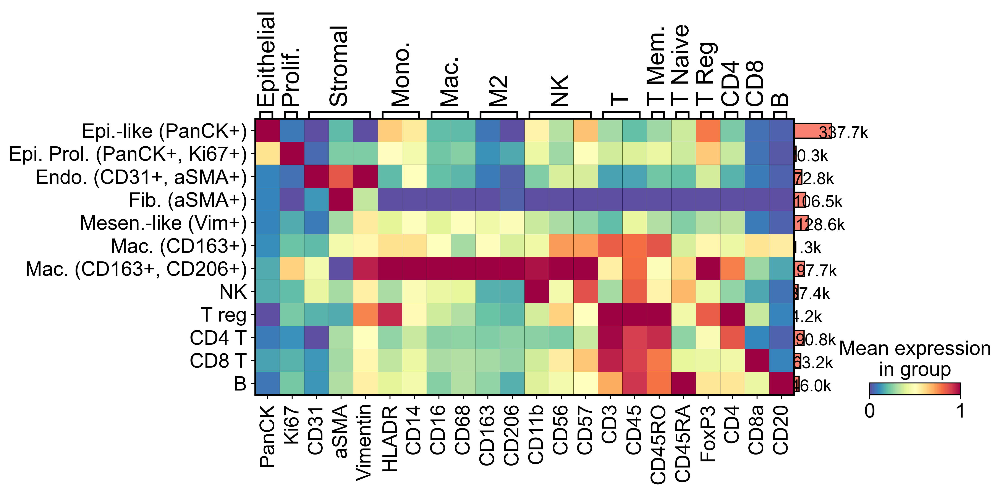

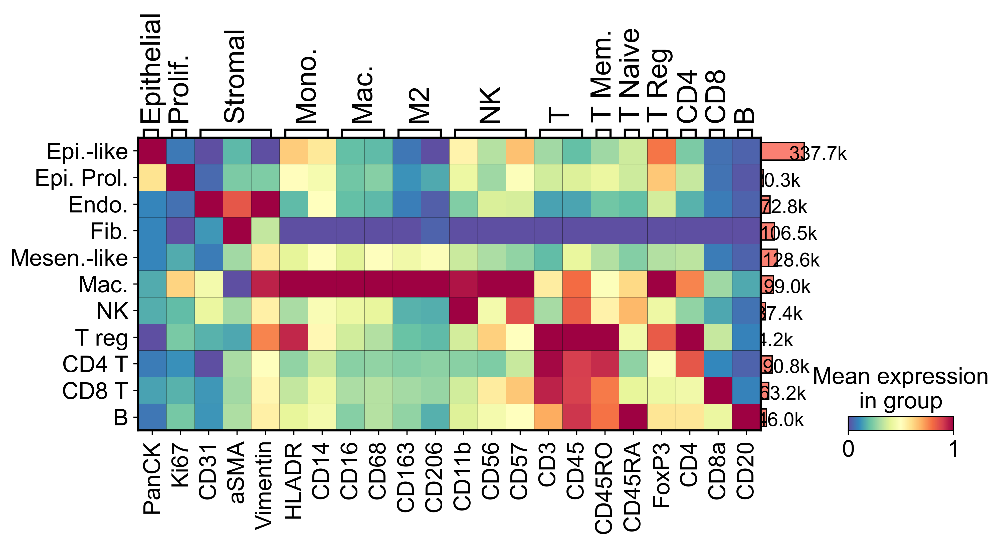

In [11]:
from scripts.load_yaml import load
metadata = load('metadata/ggo_config.yml')
sc.settings.set_figure_params(dpi=200, dpi_save=300, fontsize=20)
for celltype in ['celltype', 'celltype_broad']:
    mp = sc.pl.matrixplot(
        adata_g,
        groupby = celltype,
        var_names = metadata[panel_g]['var_celltype_groups'],
        #log = True,
        cmap = 'Spectral_r',
        standard_scale = 'var',
        vmax = 1,
        return_fig = True,
        use_raw = False
    )
    mp.add_totals().style(cmap = 'Spectral_r', edge_color='black')
    mp.show()
    os.makedirs(f'figures/PANEL_G/{celltype}/', exist_ok = True)
    mp.savefig(f'figures/PANEL_G/{celltype}/matrixplot.pdf')
    plt.close()

# Panel H

In [19]:
from scripts.load_yaml import load
metadata = load('metadata/ggo_config.yml')

panel_h = 'PANEL_H'
adata_h = adata_dict2[panel_h].copy()
adata_h = adata_h[~adata_h.obs['celltype'].isin(['Low Expr.', 'Other'])]

In [20]:
adata_h.obs['celltype'] = adata_h.obs['celltype'].replace({'Mono.':'NK'})
adata_h.obs['celltype_broad'] = adata_h.obs['celltype_broad'].replace({'Mono.':'NK'})
adata_h.obs['celltype'] = adata_h.obs['celltype'].replace({'Neut.':'Monocyte'})
adata_h.obs['celltype_broad'] = adata_h.obs['celltype_broad'].replace({'Neut.':'Monocyte'})

for celltype in ['celltype', 'celltype_broad']:
    adata_h.obs[celltype] = pd.Categorical(adata_h.obs[celltype], categories = metadata[panel_h][f'{celltype}_orders'])
# adata.obs['celltype'] = adata.obs['celltype'].replace({'B / Memory T':'B'})
# adata.obs['celltype_broad'] = adata.obs['celltype_broad'].replace({'B / Memory T':'B'})
# adata.obs['celltype'] = adata.obs['celltype'].replace({'Epi.-like (PanCK++)':'Epi.-like (PanCK+)'})

# adata.obs['celltype'] = adata.obs['celltype'].replace({'Endo. (CD31+)':'NK'})
# adata.obs.loc[adata.obs['celltype']=='NK','celltype_broad'] = 'NK'

/var/folders/m3/jlzygtz56hn0n13xjz1g33380000gn/T/ipykernel_26448/2281232795.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_h.obs['celltype'] = adata_h.obs['celltype'].replace({'Mono.':'NK'})


In [16]:
%%time
adata_h = run_umap(adata_h)
# sc.pl.umap(adata, color = 'celltype_esi', frameon = False)

Performing PCA...
Performing Neighborhood Calculation...
Performing UMAP...
CPU times: user 51.3 s, sys: 821 ms, total: 52.1 s
Wall time: 51.2 s


## Reclustering Epithelial Cells

In [132]:
eh = adata_h[adata_h.obs['celltype_broad'].isin(['Epi.-like', 'Epi.'])]
eh = eh[:, ['PanCK', 'RAGE', 'SFTPC']].copy()
eh

AnnData object with n_obs × n_vars = 481533 × 3
    obs: 'sample', 'roi', 'obj_id', 'X_centroid', 'Y_centroid', 'TMA: GGO#(N)', 'Dense scar (MM)', 'MM Class', 'sample_y', 'GGO ID', 'aah', 'Race.1', 'Ratio (100%)', 'Race', 'PATH STAGE', 'Comment', 'INV SIZE (MM)', 'core', 'sample_x', 'panel', 'Smoking Status', 'TMA: GGO# (T)', 'Molecular', 'Smoking', 'Radiology', 'clinical tumor SIZE (cm)', 'description', 'pred', 'Packyrs', 'SOLID COMP', 'Gender', 'Age', 'minor', 'area', 'perimeter', 'minor_axis_length', 'major_axis_length', 'eccentricity', 'solidity', 'DNA', 'cluster_0.5', 'celltype', 'celltype_cid', 'celltype_broad', 'ROI_area', 'pathology', 'radio'
    var: 'metal', 'panel'
    uns: 'celltype_broad_colors', 'celltype_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'spatial'

/home/june/miniconda3/envs/rsc/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


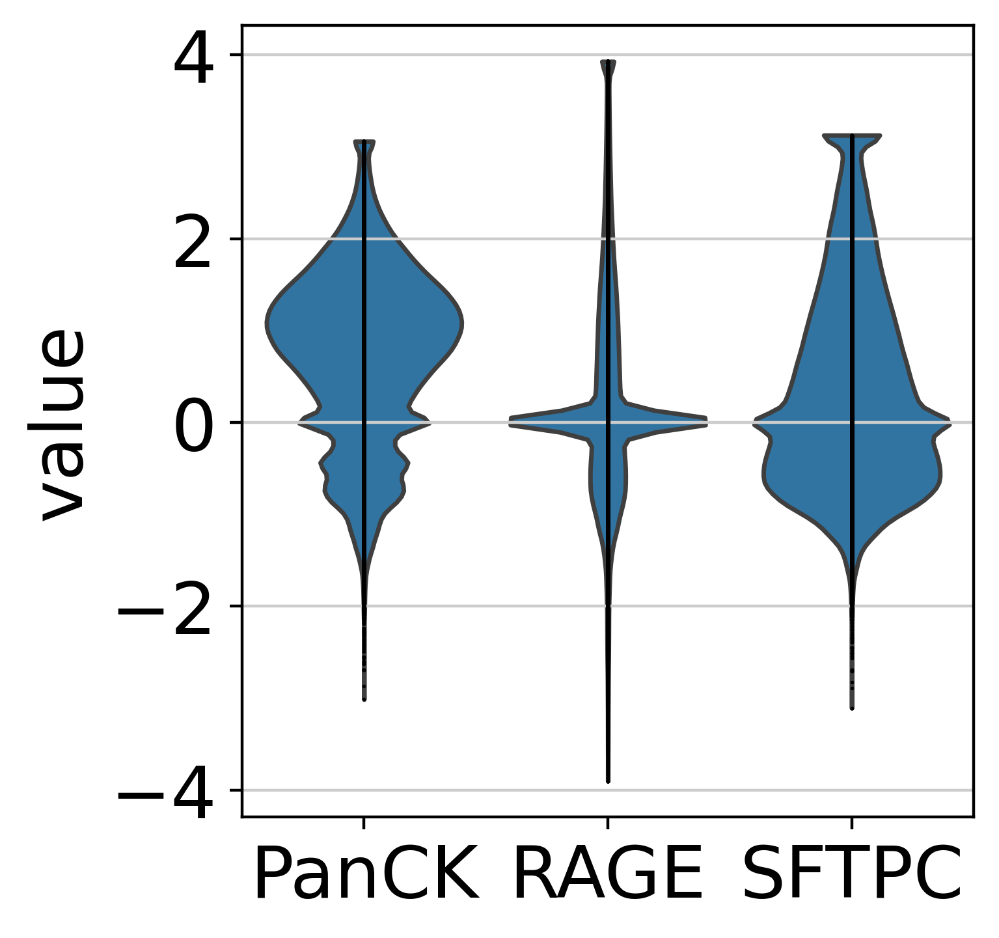

In [133]:
sc.pl.violin(eh, keys = eh.var.index, use_raw = False, jitter = False)

In [134]:
def rage_sftpc(s):
    if s['SFTPC'] > 1 and s['RAGE'] > 1:
        if s['SFTPC'] * 2 > s['RAGE']:
            return ' (SFTPC+)'
        return ' (RAGE+)'
    elif s['SFTPC'] > 1:
        return ' (SFTPC+)'
    elif s['RAGE'] > 1:
        return ' (RAGE+)'
    return ''
  

t = pd.DataFrame(eh[:,'PanCK'].X > -0.5).replace({True:'Tumor-like', False: 'Epi.-like'}).rename(columns = {0:'tumor'})
eh.obs['tumor'] = t['tumor'].tolist()
eh.obs['tumor_subgroup'] = eh.obs['tumor'] + eh_df.apply(rage_sftpc, axis = 1, result_type = 'reduce')
eh_df = eh.to_df()
eh_df['tumor_subgroup'] = eh.obs['tumor_subgroup']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


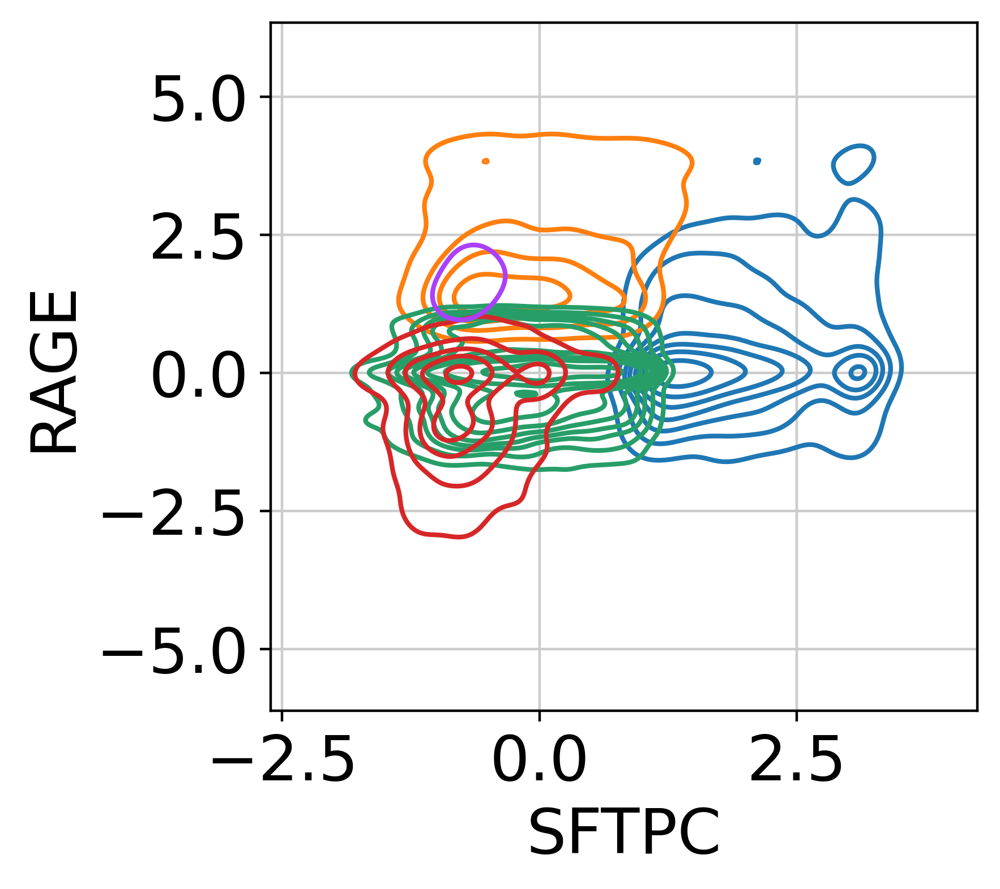

In [135]:
sns.kdeplot(eh_df.sample(10000), x = 'SFTPC', y = 'RAGE', hue = 'tumor_subgroup')
plt.legend().remove()

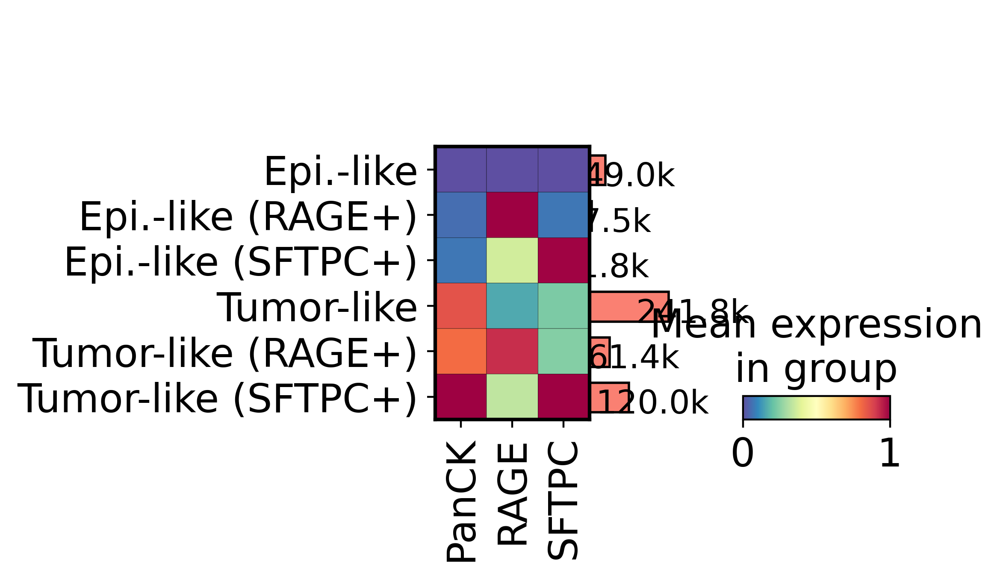

In [136]:
from scripts.load_yaml import load
metadata = load('metadata/ggo_config.yml')
sc.settings.set_figure_params(dpi=200, dpi_save=300, fontsize=20)
mp = sc.pl.matrixplot(
    eh,
    groupby = 'tumor_subgroup',
    var_names = eh.var.index,
    #log = True,
    cmap = 'Spectral_r',
    standard_scale = 'var',
    vmax = 1,
    return_fig = True,
    use_raw = False
)
mp.add_totals().style(cmap = 'Spectral_r', edge_color='black')
mp.show()

In [137]:
adata_h.obs['celltype'] = adata_h.obs['celltype'].astype(str)
adata_h.obs.loc[eh.obs.index,'celltype'] = eh.obs['tumor_subgroup']
adata_h.obs['celltype_broad'] = adata_h.obs['celltype'].str.split(' (', regex = False).str[0]

In [138]:
metadata = load('metadata/ggo_config.yml')
for ct in ['celltype', 'celltype_broad']:
    adata_h.obs[ct] = pd.Categorical(adata_h.obs[ct], categories = metadata[panel_h][f'{ct}_orders'], ordered = True)
    adata_h.uns[f'{ct}_colors'] = metadata[panel_h][f'{ct}_colors']

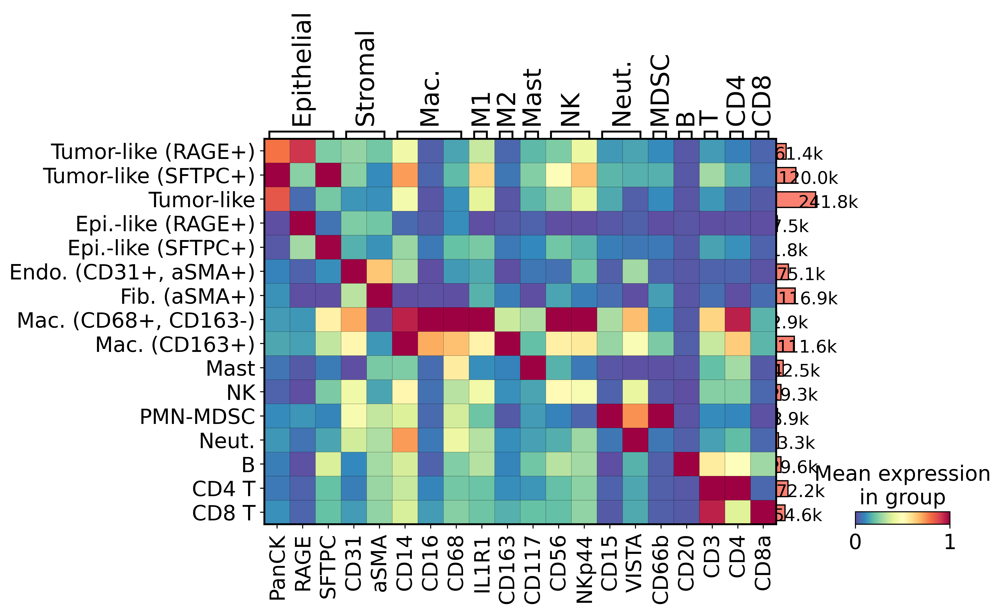

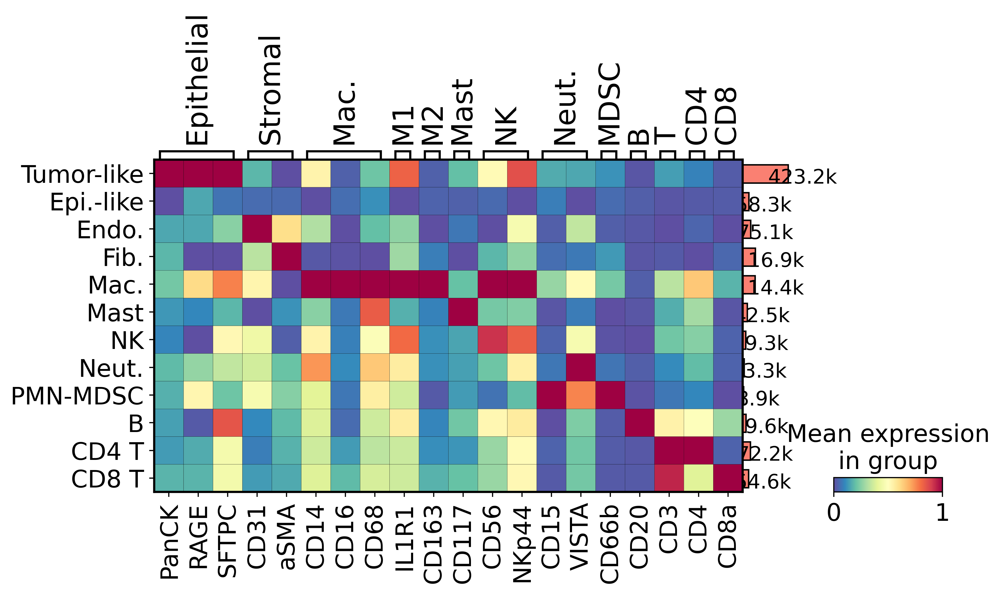

In [154]:
from scripts.load_yaml import load
metadata = load('metadata/ggo_config.yml')
sc.settings.set_figure_params(dpi=200, dpi_save=300, fontsize=20)
for celltype in ['celltype', 'celltype_broad']:
    mp = sc.pl.matrixplot(
        adata_h,
        groupby = celltype,
        var_names = metadata[panel_h]['var_celltype_groups'],
        #log = True,
        cmap = 'Spectral_r',
        standard_scale = 'var',
        vmax = 1,
        return_fig = True,
        use_raw = False
    )
    mp.add_totals().style(cmap = 'Spectral_r', edge_color='black')
    mp.show()
    os.makedirs(f'figures/PANEL_H/{celltype}/', exist_ok = True)
    mp.savefig(f'figures/PANEL_H/{celltype}/matrixplot.pdf')
    plt.close()

# Run UMAP

In [21]:
from scripts.load_yaml import load
metadata = load('metadata/ggo_config.yml')

adata_dict = dict()

for p in ['PANEL_G', 'PANEL_H']:
    adata_dict[p] = sc.read(metadata[p]['AnnData']['phenotyped_umap_name'])

Only considering the two last: ['.umap', '.h5ad'].
Only considering the two last: ['.umap', '.h5ad'].
Only considering the two last: ['.umap', '.h5ad'].
Only considering the two last: ['.umap', '.h5ad'].


In [ ]:
%%time
adata_g2 = run_umap(adata_g)

In [157]:
%%time
adata_h2 = run_umap(adata_h)

Performing PCA...
Performing Neighborhood Calculation...
Performing UMAP...
CPU times: user 2h 18min 50s, sys: 32min 48s, total: 2h 51min 39s
Wall time: 14min 7s


/opt/homebrew/Caskroom/miniforge/base/envs/ggo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


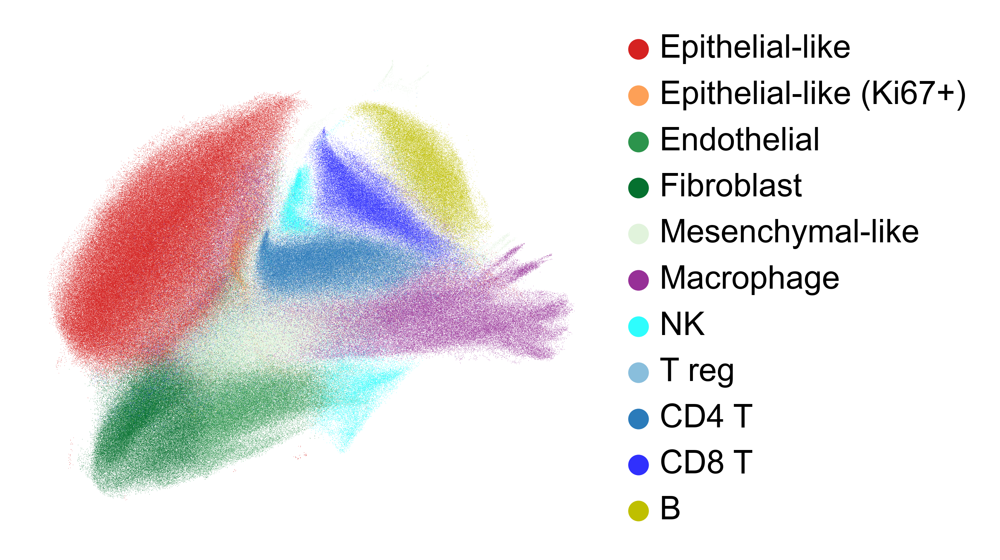

/opt/homebrew/Caskroom/miniforge/base/envs/ggo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


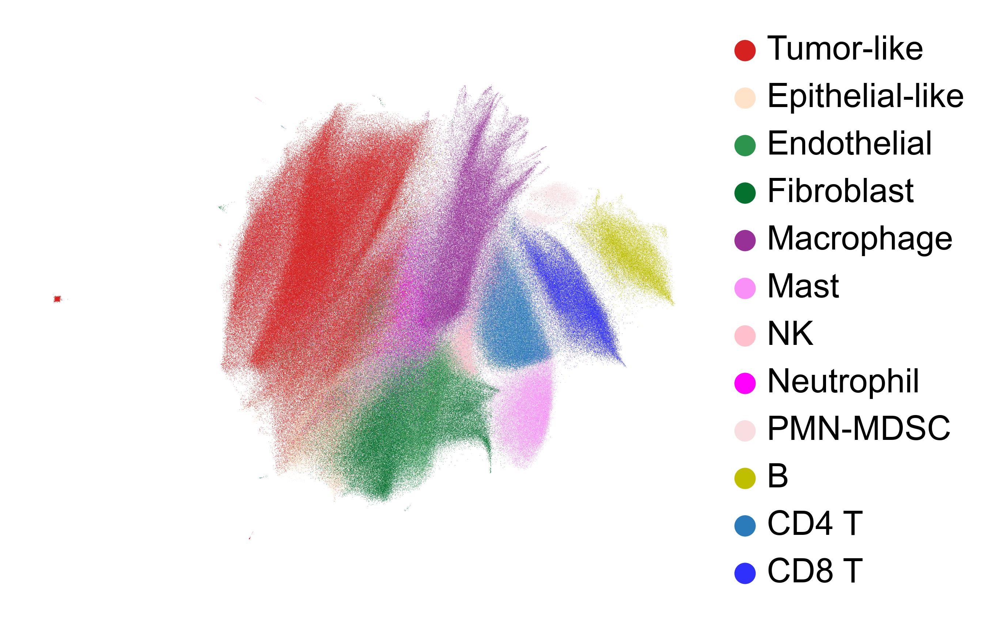

/opt/homebrew/Caskroom/miniforge/base/envs/ggo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


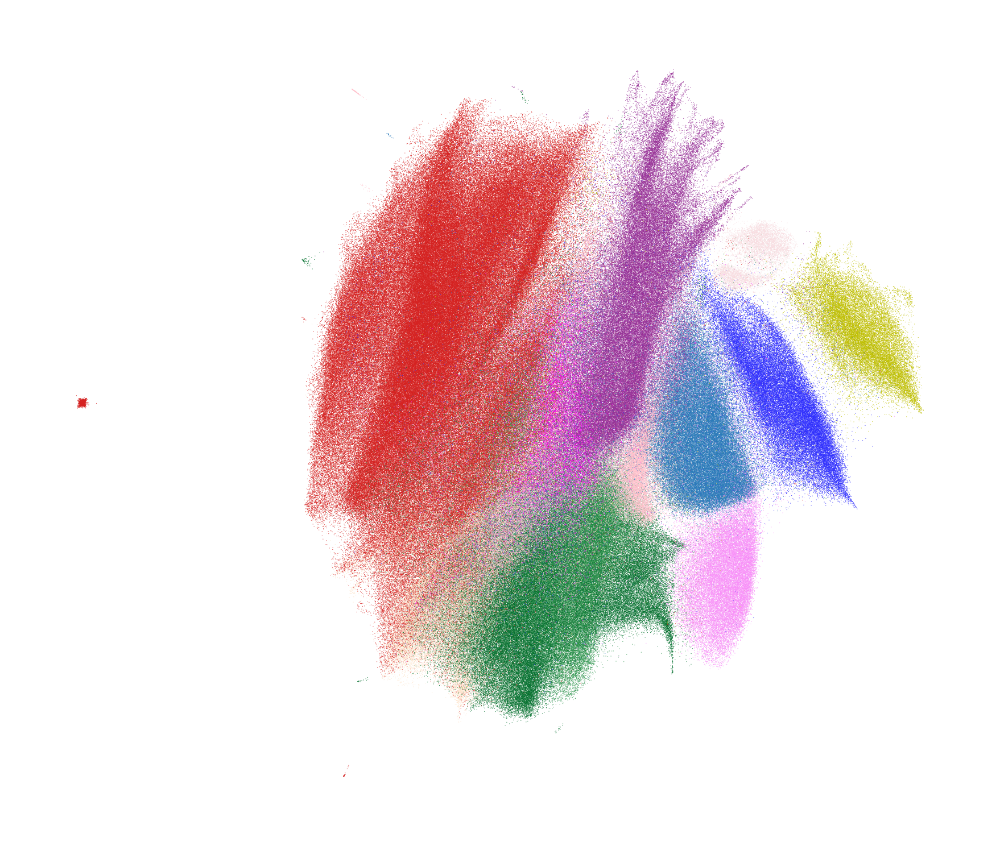

In [34]:

sc.settings.set_figure_params(dpi=200, dpi_save=300, fontsize=12)
fig, ax = plt.subplots(1,1,figsize = (3.5,3), dpi = 300)
sc.pl.umap(adata_dict['PANEL_G'], color = 'celltype_broad', frameon = False, show = False, title = '', ax = ax, size = 0.07)
plt.savefig('figures/PANEL_G/celltype_broad/PANEL_G_umap.pdf')
plt.show()
plt.close()

fig, ax = plt.subplots(1,1,figsize = (4,3), dpi = 300)
sc.pl.umap(adata_dict['PANEL_H'], color = 'celltype_broad', frameon = False, show = False, title = '', ax = ax, size = 0.07)
plt.savefig('figures/PANEL_H/celltype_broad/PANEL_H_umap.pdf')
plt.show()
plt.close()

fig, ax = plt.subplots(1,1,figsize = (3.5,3), dpi = 300)
sc.pl.umap(adata_dict['PANEL_H'], color = 'celltype_broad', frameon = False, show = False, title = '', ax = ax, size = 0.07)
ax.legend().remove()
plt.savefig('figures/PANEL_H/celltype_broad/PANEL_H_umap_no_legend.pdf')
plt.show()
plt.close()

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, fontsize=12)
sc.pl.umap(adata_dict['PANEL_G'], color = adata_dict['PANEL_G'].var.index, frameon = False, show = False, size = 0.07, vmin = -2, vmax = 2, use_raw = False)
plt.savefig('figures/PANEL_G/celltype_broad/PANEL_G_umap_all.pdf')
plt.show()
plt.close()

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (4,3), dpi = 300)
sc.pl.umap(adata_dict['PANEL_H'], color = adata_dict['PANEL_H'].var.index, frameon = False, show = False, ax = ax, size = 0.07, vmin = -2, vmax = 2, use_raw = False)
plt.savefig('figures/PANEL_H/celltype_broad/PANEL_H_umap_all.pdf')
plt.show()
plt.close()


In [166]:
# save results
adata_g2.write(metadata['PANEL_G']['AnnData']['phenotyped_umap_name'])
adata_h2.write(metadata['PANEL_H']['AnnData']['phenotyped_umap_name'])